# EDA

In [1]:
from eda import run
run()


  HDR-Eye EDA Report

Scenes: 40 total  |  33 train  |  7 test

Scene     Files EV missing EV values                                       LDR   Split
--------------------------------------------------------------------------------------
C05           8          0 [-2.7, -2.0, -1.3, 0.0, 0.7, 1.3, 2.0, 2.7]       ✓   train
C06           9          0 [-2.7, -2.0, -1.3, -0.7, 0.0, 0.7, 1.3, 2.0, 2.7]     ✓   train
C07           9          0 [-2.7, -2.0, -1.3, -0.7, 0.0, 0.7, 1.3, 2.0, 2.7]     ✓   train
C08           9          9 n/a                                      ✓   train
C10           9          0 [-2.7, -2.0, -1.3, -0.7, 0.0, 0.7, 1.3, 2.0, 2.7]     ✓   train
C11          14          0 [0.0]                                             ✓   train
C12           9          0 [-2.7, -2.0, -1.3, -0.7, 0.0, 0.7, 1.3, 2.0, 2.7]     ✓   train
C13           5          5 n/a                                      ✓   train
C14           5          5 n/a                                     

# Copy files to input folder

In [1]:
from prepare_data import run
run()  


  Data preparation — scanning and copying

  C05  under ✓ | over ✓ | LDR ✓
  C06  under ✓ | over ✓ | LDR ✓
  C07  under ✓ | over ✓ | LDR ✓
  ⚠ C08: no EV=±2.7 images found, skipping
  C10  under ✓ | over ✓ | LDR ✓
  ⚠ C11: no EV=±2.7 images found, skipping
  C12  under ✓ | over ✓ | LDR ✓
  ⚠ C13: no EV=±2.7 images found, skipping
  ⚠ C14: no EV=±2.7 images found, skipping
  ⚠ C15: no EV=±2.7 images found, skipping
  C16  under ✓ | over ✓ | LDR ✓
  C18  under ✓ | over ✓ | LDR ✓
  ⚠ C19: no EV=±2.7 images found, skipping
  ⚠ C20: no EV=±2.7 images found, skipping
  ⚠ C21: no EV=±2.7 images found, skipping
  ⚠ C22: no EV=±2.7 images found, skipping
  ⚠ C23: no EV=±2.7 images found, skipping
  ⚠ C24: no EV=±2.7 images found, skipping
  ⚠ C25: no EV=±2.7 images found, skipping
  ⚠ C26: no EV=±2.7 images found, skipping
  ⚠ C27: no EV=±2.7 images found, skipping
  ⚠ C28: no EV=±2.7 images found, skipping
  ⚠ C29: no EV=±2.7 images found, skipping
  ⚠ C30: no EV=±2.7 images found, skipping
 

# Manual data augmentation

The `prepare_data.py` script copied only images with a confirmed EV value in EXIF metadata.

For the remaining scenes (no EV metadata and no ExposureTime available), images were selected
and added manually based on visual inspection as the most likely candidates for EV = -2.7 and EV = +2.7.

Manually added scenes:
- `Bracketed_images±27`: C08, C15, C19, C20, C21, C22, C23, C24, C25, C26, C29, C30, C31, C32, C33, C39, C42, C44, C45, C46

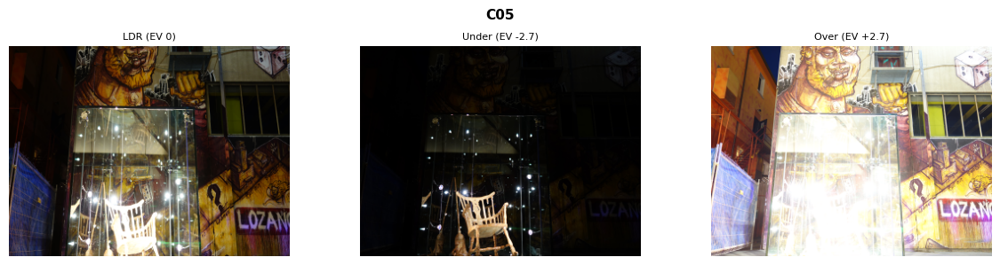

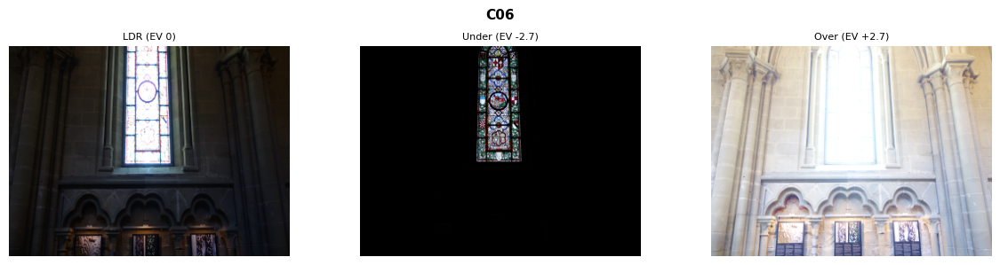

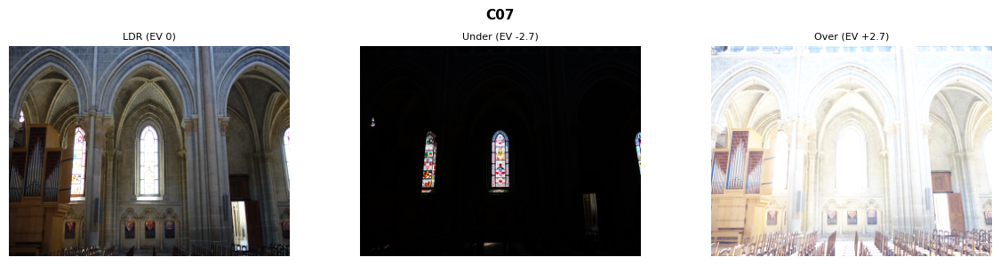

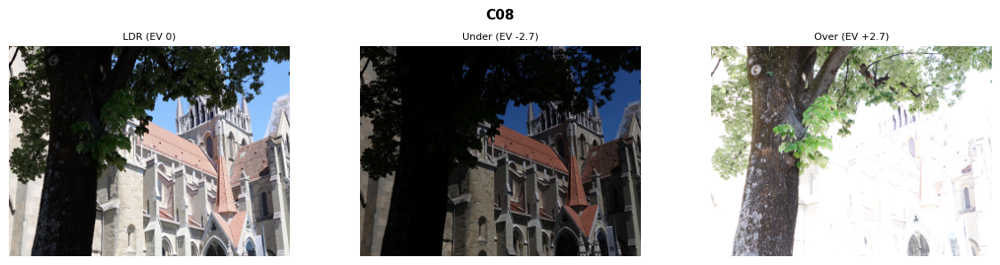

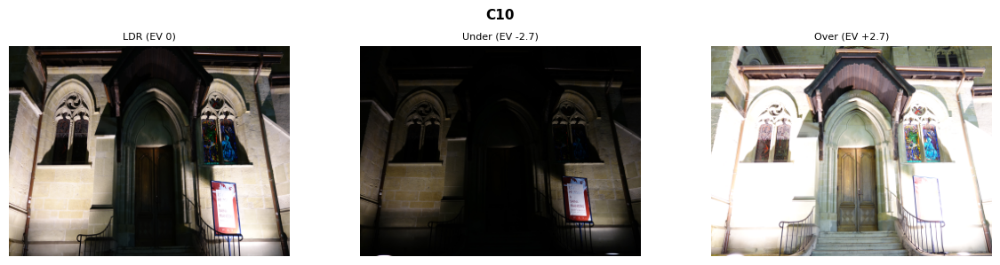

...

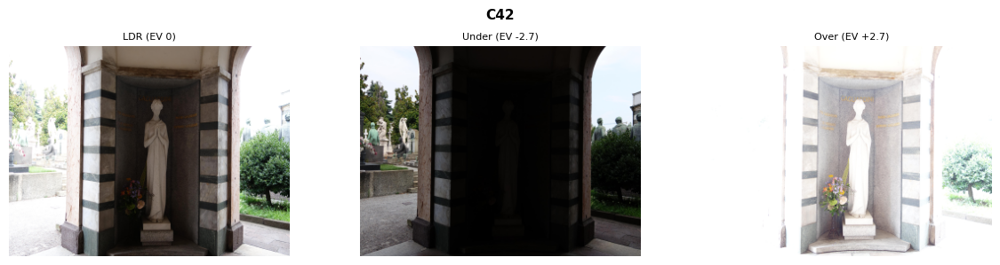

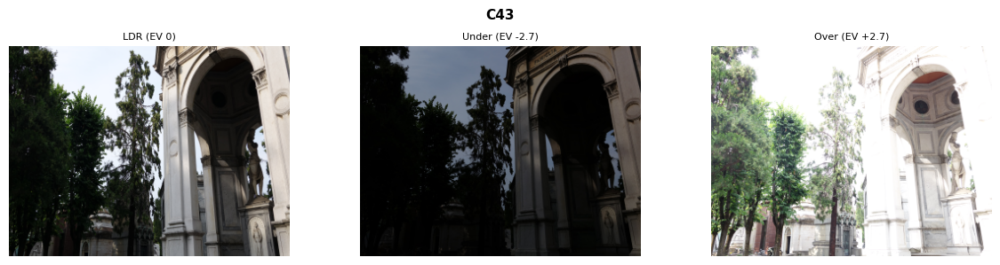

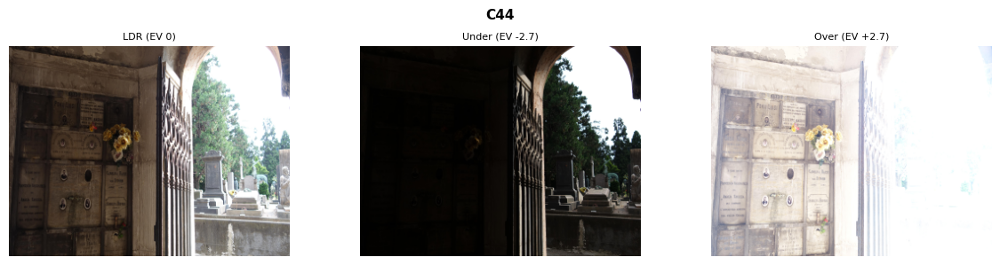

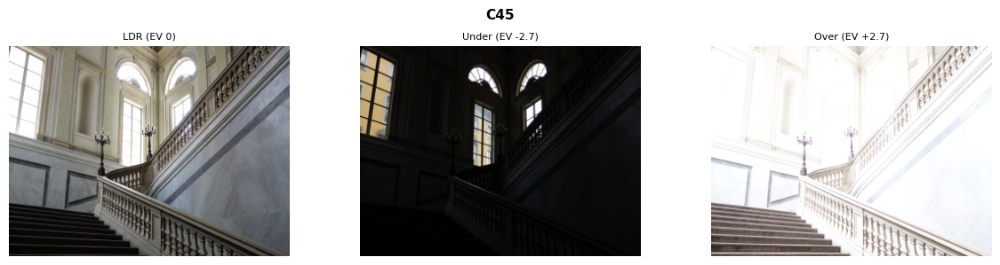

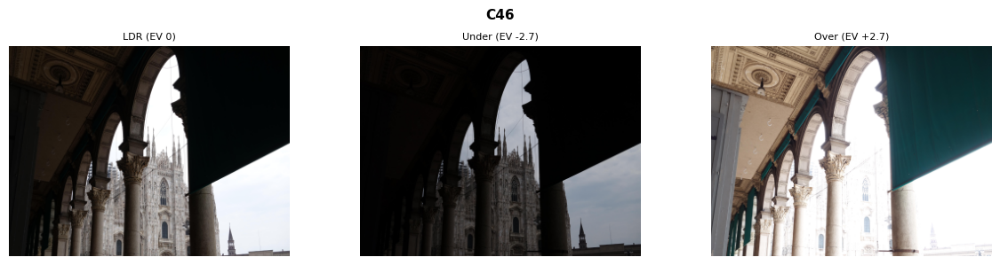

In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import cv2

ROOT      = Path("../..").resolve()
LDR_DIR   = ROOT / "neural_network" / "nn_data" / "selected" / "LDR"
UNDER_DIR = ROOT / "neural_network" / "nn_data" / "selected" / "Bracketed_images-27"
OVER_DIR  = ROOT / "neural_network" / "nn_data" / "selected" / "Bracketed_images+27"

THUMB_W, THUMB_H  = 320, 240
IMG_EXTENSIONS    = {".tif", ".tiff", ".jpg", ".jpeg", ".png"}


def find_file(directory: Path, scene: str) -> Path | None:
    for f in directory.iterdir():
        if f.stem.upper().startswith(scene.upper()) and f.suffix.lower() in IMG_EXTENSIONS:
            return f
    return None


def load_thumbnail(path: Path) -> np.ndarray:
    img = cv2.imread(str(path), cv2.IMREAD_UNCHANGED)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if img.dtype == np.uint16:
        img = (img / 256).astype(np.uint8)
    img = cv2.resize(img, (THUMB_W, THUMB_H), interpolation=cv2.INTER_AREA)
    return img


scenes = sorted([
    f.name.split("_")[0]
    for f in LDR_DIR.iterdir()
    if f.suffix.lower() in IMG_EXTENSIONS
])

for scene in scenes:
    ldr   = find_file(LDR_DIR,   scene)
    under = find_file(UNDER_DIR, scene)
    over  = find_file(OVER_DIR,  scene)

    filled = [(t, p) for t, p in [
        ("LDR (EV 0)", ldr),
        ("Under (EV -2.7)", under),
        ("Over (EV +2.7)", over)
    ] if p is not None]

    fig, axes = plt.subplots(1, len(filled), figsize=(4 * len(filled), 3))
    if len(filled) == 1:
        axes = [axes]

    fig.suptitle(scene, fontsize=11, fontweight="bold")
    for ax, (title, path) in zip(axes, filled):
        ax.imshow(load_thumbnail(path))
        ax.set_title(title, fontsize=8)
        ax.axis("off")

    plt.tight_layout()
    plt.show()
    plt.close(fig)